In [1]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import scipy as sp
import scipy.optimize
import timeit

# Задание 2

Функция, реализующая модель Лоренца

In [2]:
def get_f(sigma, b, r):
    return lambda x_0: np.array([sigma * (x_0[1] - x_0[0]), x_0[0] * (r - x_0[2]) - x_0[1], x_0[0] * x_0[1] - b * x_0[2]]) 

u = np.array([1, 1, 1])

Функция, реализующая метод Эйлера

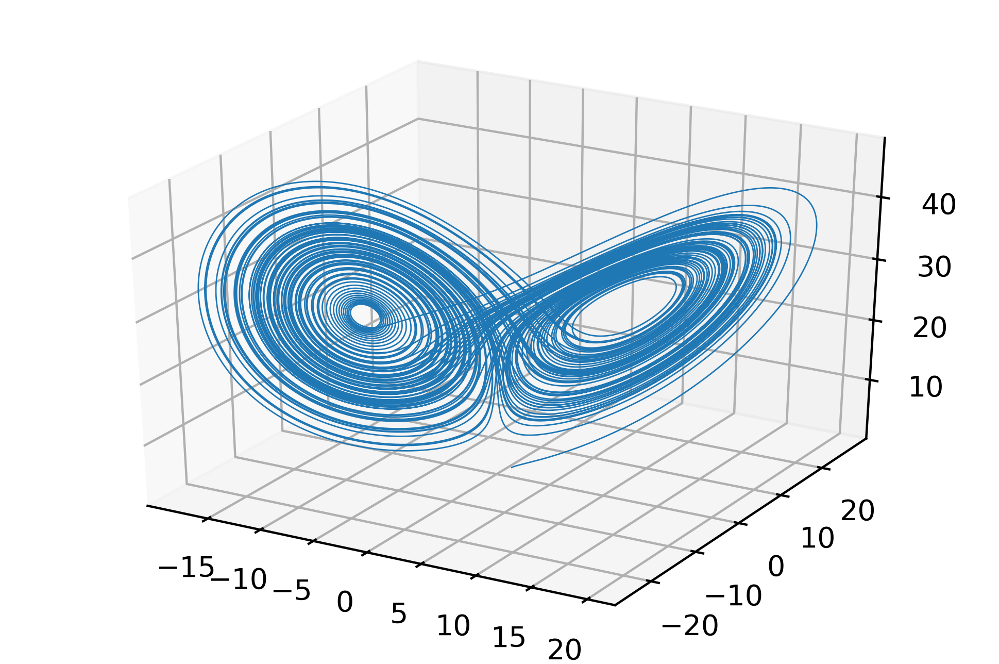

In [3]:
def euler(x_0, t_n, f, h):
    w = x_0
    w_rez = np.zeros((int(t_n/h), 3))
    for i in range(int(t_n/h)):
        w_rez[i] = w + f(w) * h
        w = w_rez[i]
    return w_rez

f = get_f(10.0, 8 / 3, 28.0)
rez = euler(u, 100, f, 0.001)
rez_eu = rez.T

_, axes = plt.subplots(nrows=1, ncols=1, figsize=(6, 4), dpi=400, subplot_kw={'projection': '3d'})
axes.plot(rez_eu[0], rez_eu[1], rez_eu[2], linewidth=0.5)
plt.show()

Функция, реализующая обратный метод Эйлера

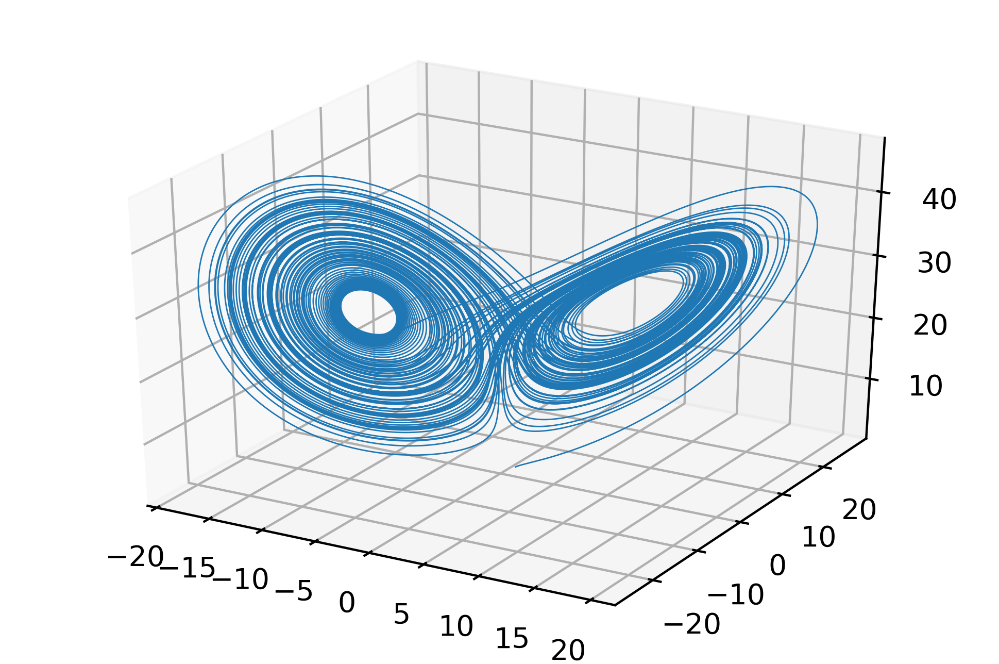

In [4]:
def implicit_euler(x_0, t_n, f, h):
    w_rez = np.zeros((int(t_n/h), 3))
    w_rez[0] = x_0
    
    def step(z, w):
        return z - h * f(z) - w
    
    for i in range(int(t_n/h)-1):
        w_rez[i+1] = sp.optimize.root(step, w_rez[i], args=(w_rez[i])).x
    return w_rez

f = get_f(10.0, 8 / 3, 28.0)
u = np.array([1, 1, 1])
rez = implicit_euler(u, 100, f, 0.001)
rez_imp = rez.T

_, axes = plt.subplots(nrows=1, ncols=1, figsize=(6, 4), dpi=400, subplot_kw={'projection': '3d'})
axes.plot(rez_imp[0], rez_imp[1], rez_imp[2], linewidth=0.5)
plt.show()  

Функция, реализующая метод Адамса–Башфорта–Моултона 4-го порядка

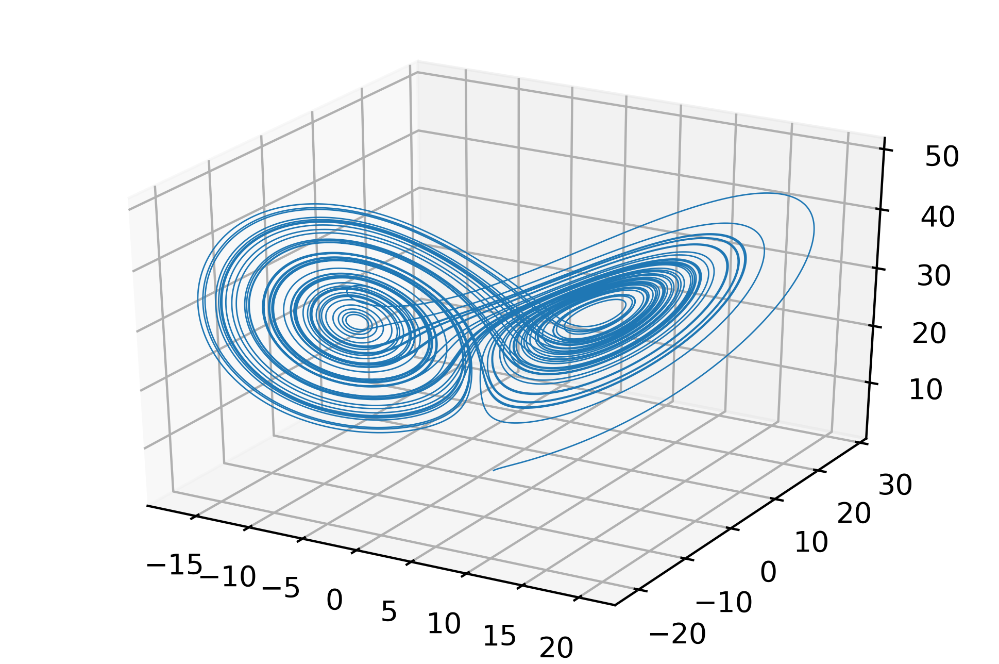

In [5]:
def adams_bashforth_moulton(x_0, t_n, f, h):
    x_eu = implicit_euler(x_0, 4*h, f, h)
    w_rez = np.zeros((int(t_n/h), 3))
    for i in range(4):
        w_rez[i] = x_eu[i]

    for i in range(4, int(t_n/h)):
        w_pred = w_rez[i-1] + h/24 * (55 * f(w_rez[i-1]) - 59 * f(w_rez[i-2]) + 37 * f(w_rez[i-3]) - 9 * f(w_rez[i-4]))
        w_rez[i] = w_rez[i-1] + h/24 * (9 * w_pred + 19 * f(w_rez[i-1]) - 5 * f(w_rez[i-2]) + f(w_rez[i-3]))
    return w_rez

u = np.array([1, 1, 1])
f = get_f(10.0, 8 / 3, 28.0)
rezalt = adams_bashforth_moulton(u, 100, f, 0.001)
rez_adams = rezalt.T

_, axes = plt.subplots(nrows=1, ncols=1, figsize=(6, 4), dpi=400, subplot_kw={'projection': '3d'})
axes.plot(rez_adams[0], rez_adams[1], rez_adams[2], linewidth=0.5)
plt.show() 

# Задание 4

In [6]:
x0 = np.random.uniform(-50, 50, (15, 1))
y0 = np.random.uniform(-50, 50, (15, 1))
z0 = np.random.uniform(0, 70, (15, 1))
init = np.concatenate((x0, y0, z0), axis=1)


Для r = 0

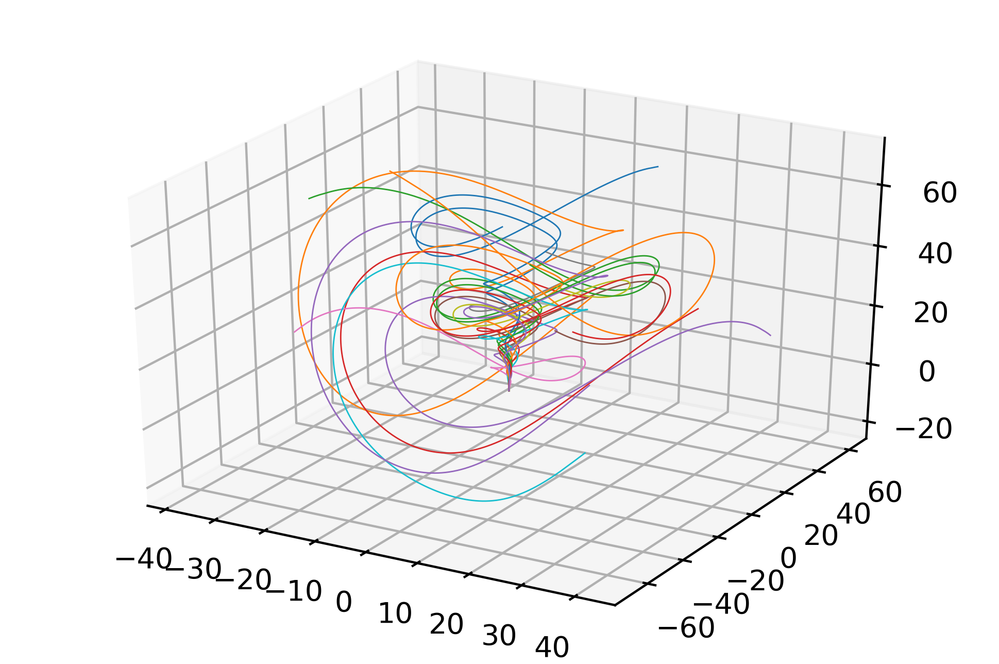

In [33]:
f = get_f(10.0, 8 / 3, 0)
_, axes = plt.subplots(nrows=1, ncols=1, figsize=(6, 4), dpi=400, subplot_kw={'projection': '3d'})
for i in range(15):
    rez = adams_bashforth_moulton(init[i], 100, f, 0.001)
    rezt = rez.T
    axes.plot(rezt[0], rezt[1], rezt[2], linewidth=0.5)
plt.show() 

Для r = 10

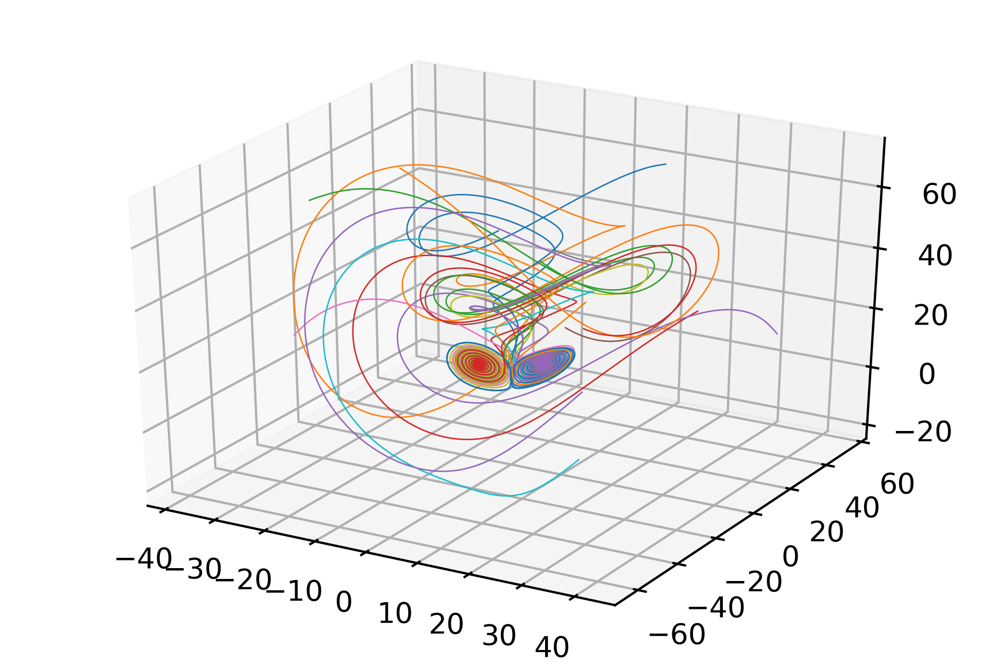

In [34]:
f = get_f(10.0, 8 / 3, 10)
_, axes = plt.subplots(nrows=1, ncols=1, figsize=(6, 4), dpi=400, subplot_kw={'projection': '3d'})
for i in range(15):
    rez = adams_bashforth_moulton(init[i], 100, f, 0.001)
    rezt = rez.T
    axes.plot(rezt[0], rezt[1], rezt[2], linewidth=0.5)
plt.show() 

Для r = 20

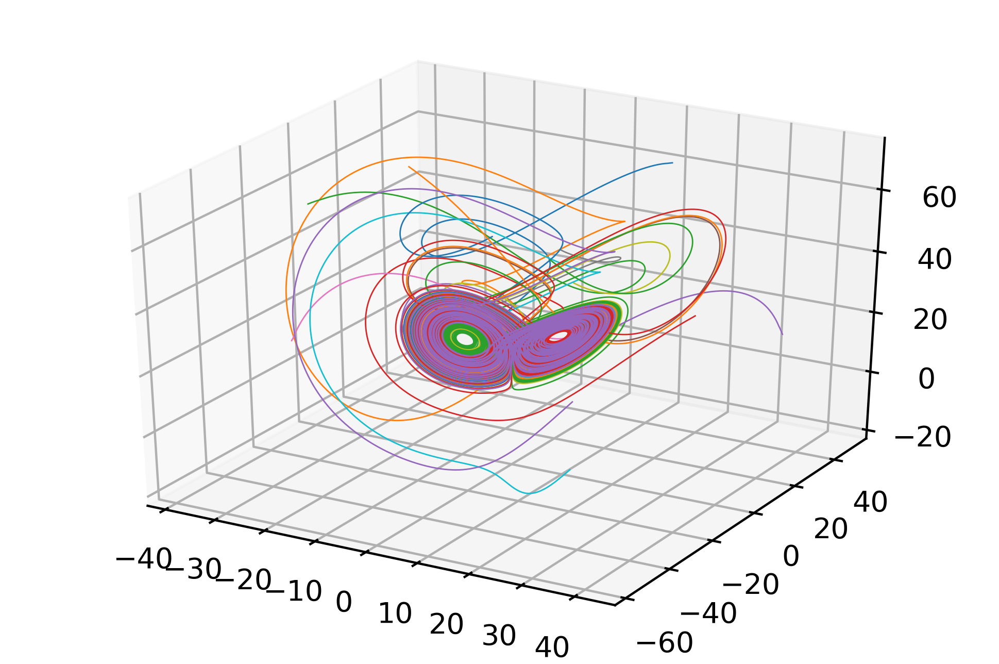

In [35]:
f = get_f(10.0, 8 / 3, 20)
_, axes = plt.subplots(nrows=1, ncols=1, figsize=(6, 4), dpi=400, subplot_kw={'projection': '3d'})
for i in range(15):
    rez = adams_bashforth_moulton(init[i], 100, f, 0.001)
    rezt = rez.T
    axes.plot(rezt[0], rezt[1], rezt[2], linewidth=0.5)
plt.show()

Для r = 30

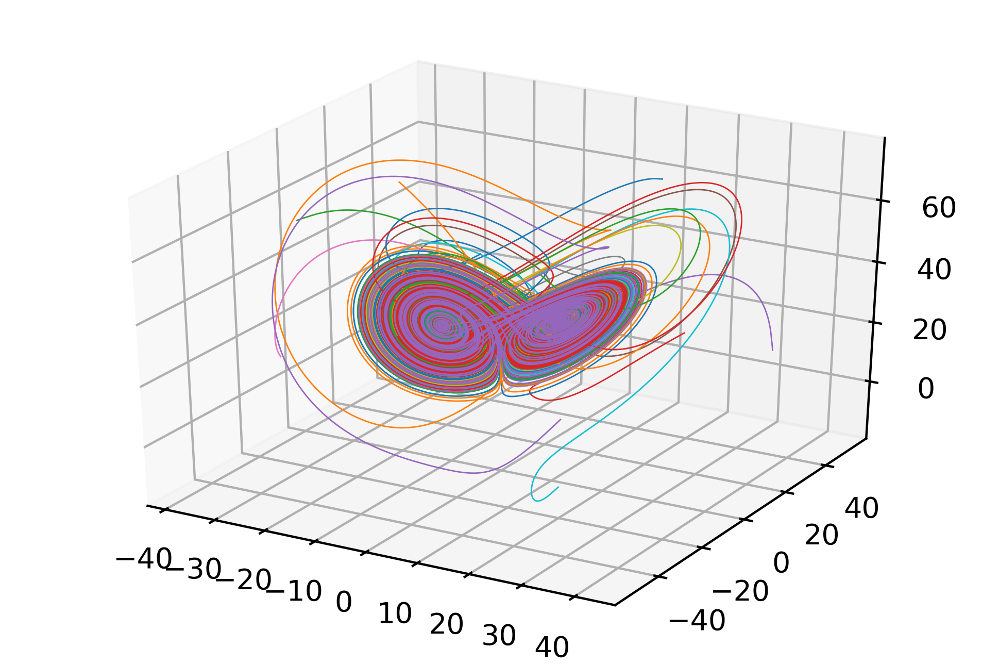

In [36]:
f = get_f(10.0, 8 / 3, 30)
_, axes = plt.subplots(nrows=1, ncols=1, figsize=(6, 4), dpi=400, subplot_kw={'projection': '3d'})
for i in range(15):
    rez = adams_bashforth_moulton(init[i], 100, f, 0.001)
    rezt = rez.T
    axes.plot(rezt[0], rezt[1], rezt[2], linewidth=0.5)
plt.show()

# Задание 5

In [9]:
x0 = np.random.uniform(-50, 50, (100, 1))
y0 = np.random.uniform(-50, 50, (100, 1))
z0 = np.random.uniform(0, 70, (100, 1))
init = np.concatenate((x0, y0, z0), axis=1)

f = get_f(10.0, 8 / 3, 30)
t1 = timeit.default_timer()
for i in range(100):
    rez = adams_bashforth_moulton(init[i], 40, f, 0.001)
t2 = timeit.default_timer()


print('Суммарное время, затраченное на нахождение всех решений для всех сгенерированных \
начальных условий: {} секунды'.format(round(t2-t1, 3)))

Суммарное время, затраченное на нахождение всех решений для всех сгенерированных начальных условий: 177.192 секунды


In [20]:
f = get_f(10.0, 8 / 3, 30)
t1 = timeit.default_timer()
for i in range(100):
    rez = adams_bashforth_moulton(init[i], 40, f, 0.0005)
t2 = timeit.default_timer()
print('Суммарное время, затраченное на нахождение всех решений для всех сгенерированных \
начальных условий: {} секунды'.format(round(t2-t1, 3)))

Суммарное время, затраченное на нахождение всех решений для всех сгенерированных начальных условий: 368.964 секунды


In [11]:
f = get_f(10.0, 8 / 3, 30)
t1 = timeit.default_timer()
for i in range(100):
    rez = adams_bashforth_moulton(init[i], 40, f, 0.01)
t2 = timeit.default_timer()
print('Суммарное время, затраченное на нахождение всех решений для всех сгенерированных \
начальных условий: {} секунды'.format(round(t2-t1, 3)))

Суммарное время, затраченное на нахождение всех решений для всех сгенерированных начальных условий: 17.653 секунды


Пункт с

Метод Эйлера, шаг 0.001

In [12]:
f = get_f(10.0, 8 / 3, 30)
t1 = timeit.default_timer()
for i in range(100):
    rez = euler(init[i], 40, f, 0.001)
t2 = timeit.default_timer()
print('Суммарное время, затраченное на нахождение всех решений для всех сгенерированных \
начальных условий: {} секунды'.format(round(t2-t1, 3)))

Суммарное время, затраченное на нахождение всех решений для всех сгенерированных начальных условий: 23.194 секунды


Метод Эйлера, шаг 0.0005

In [18]:
f = get_f(10.0, 8 / 3, 30)
t1 = timeit.default_timer()
for i in range(100):
    rez = euler(init[i], 40, f, 0.0005)
t2 = timeit.default_timer()
print('Суммарное время, затраченное на нахождение всех решений для всех сгенерированных \
начальных условий: {} секунды'.format(round(t2-t1, 3)))

Суммарное время, затраченное на нахождение всех решений для всех сгенерированных начальных условий: 58.462 секунды


Метод Эйлера, шаг 0.01

In [14]:
f = get_f(10.0, 8 / 3, 30)
t1 = timeit.default_timer()
for i in range(100):
    rez = euler(init[i], 40, f, 0.01)
t2 = timeit.default_timer()
print('Суммарное время, затраченное на нахождение всех решений для всех сгенерированных \
начальных условий: {} секунды'.format(round(t2-t1, 3)))

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: overflow encountered in double_scalars
  
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in double_scalars
  
/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:5: RuntimeWarning: invalid value encountered in add
  """


Суммарное время, затраченное на нахождение всех решений для всех сгенерированных начальных условий: 2.271 секунды


Неявный метод Эйлера, шаг 0.001

In [15]:
f = get_f(10.0, 8 / 3, 30)
t1 = timeit.default_timer()
for i in range(100):
    rez = implicit_euler(init[i], 40, f, 0.001)
t2 = timeit.default_timer()
print('Суммарное время, затраченное на нахождение всех решений для всех сгенерированных \
начальных условий: {} секунды'.format(round(t2-t1, 3)))

Суммарное время, затраченное на нахождение всех решений для всех сгенерированных начальных условий: 387.789 секунды


Неявный метод Эйлера, шаг 0.0005

In [17]:
f = get_f(10.0, 8 / 3, 30)
t1 = timeit.default_timer()
for i in range(100):
    rez = implicit_euler(init[i], 40, f, 0.0005)
t2 = timeit.default_timer()
print('Суммарное время, затраченное на нахождение всех решений для всех сгенерированных \
начальных условий: {} секунды'.format(round(t2-t1, 3)))

Суммарное время, затраченное на нахождение всех решений для всех сгенерированных начальных условий: 727.005 секунды


Неявный метод Эйлера, шаг 0.01

In [19]:
f = get_f(10.0, 8 / 3, 30)
t1 = timeit.default_timer()
for i in range(100):
    rez = implicit_euler(init[i], 40, f, 0.01)
t2 = timeit.default_timer()
print('Суммарное время, затраченное на нахождение всех решений для всех сгенерированных \
начальных условий: {} секунды'.format(round(t2-t1, 3)))

Суммарное время, затраченное на нахождение всех решений для всех сгенерированных начальных условий: 37.615 секунды


Виды фазовых портретов при разных значениях шага h

Для явного метода Эйлера

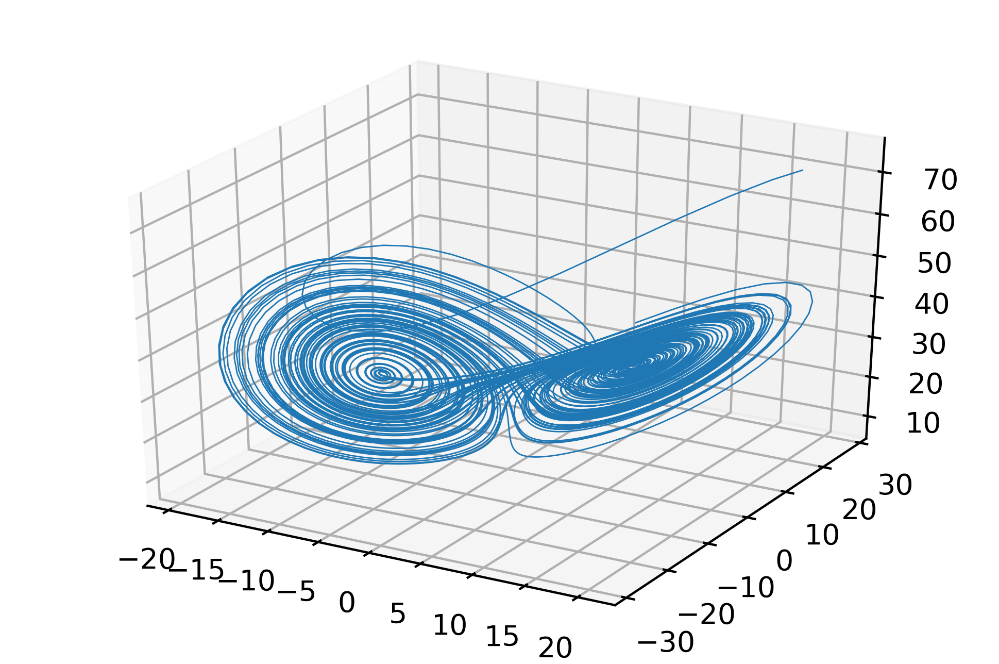

In [22]:
_, axes = plt.subplots(nrows=1, ncols=1, figsize=(6, 4), dpi=400, subplot_kw={'projection': '3d'})
f = get_f(10.0, 8 / 3, 30)
rez = euler(init[0], 100, f, 0.01).T
axes.plot(rez[0], rez[1], rez[2], linewidth=0.5)
plt.show()

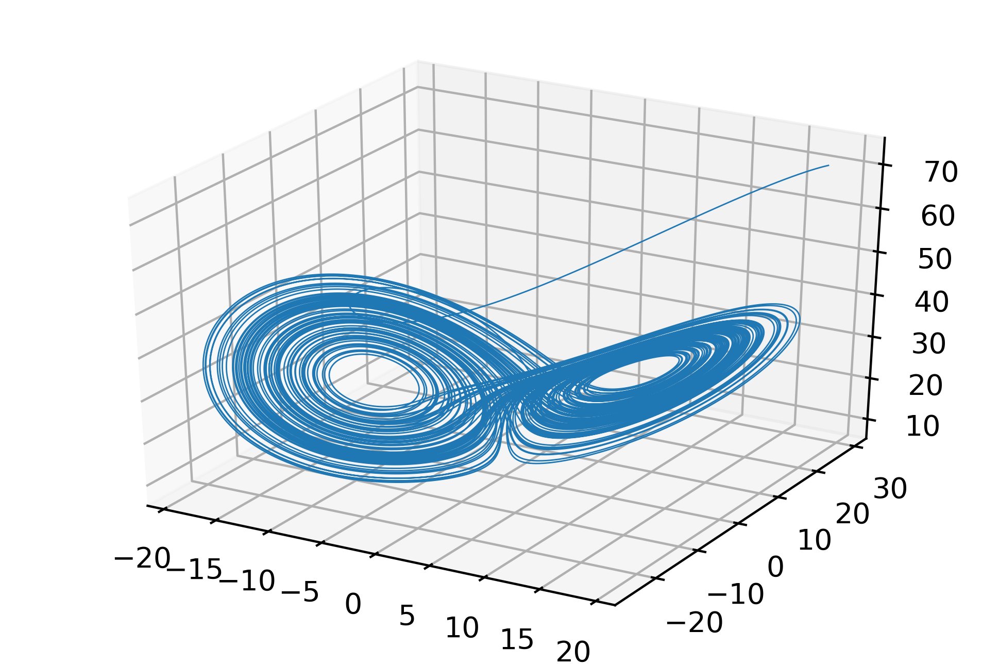

In [23]:
_, axes = plt.subplots(nrows=1, ncols=1, figsize=(6, 4), dpi=400, subplot_kw={'projection': '3d'})
f = get_f(10.0, 8 / 3, 30)
rez = euler(init[0], 100, f, 0.001).T
axes.plot(rez[0], rez[1], rez[2], linewidth=0.5)
plt.show()

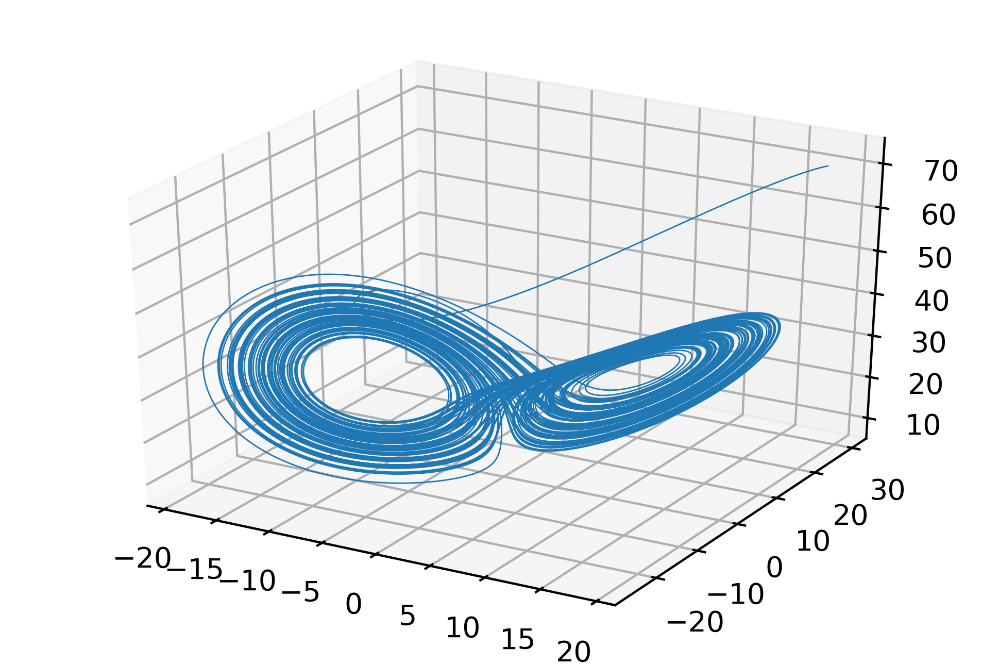

In [24]:
_, axes = plt.subplots(nrows=1, ncols=1, figsize=(6, 4), dpi=400, subplot_kw={'projection': '3d'})
f = get_f(10.0, 8 / 3, 30)
rez = euler(init[0], 100, f, 0.0001).T
axes.plot(rez[0], rez[1], rez[2], linewidth=0.5)
plt.show()

Для неявного метода Эйлера

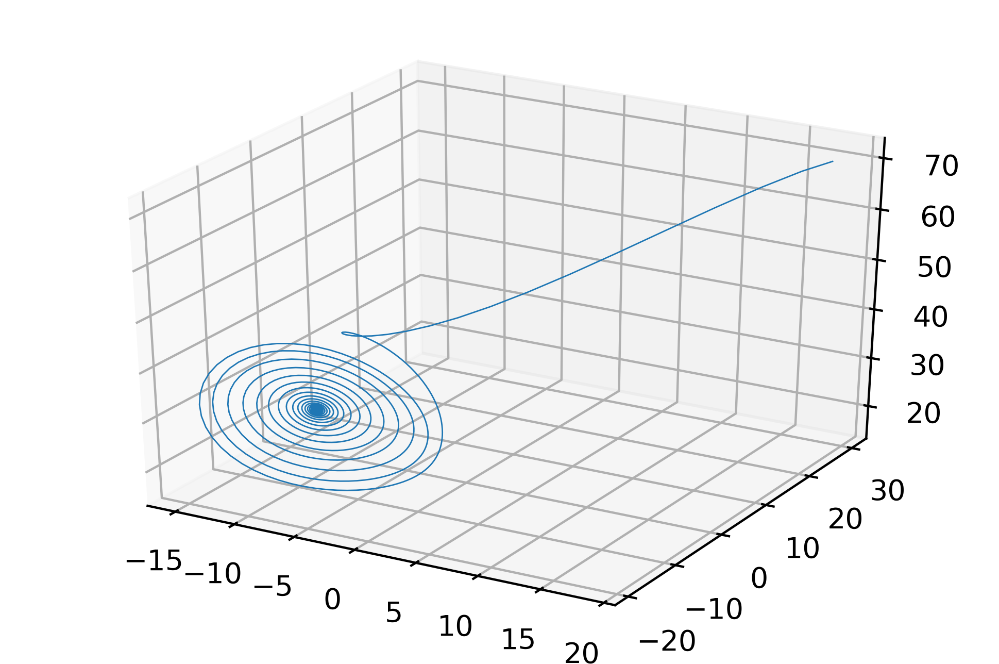

In [31]:
_, axes = plt.subplots(nrows=1, ncols=1, figsize=(6, 4), dpi=400, subplot_kw={'projection': '3d'})
f = get_f(10.0, 8 / 3, 30)
rez = implicit_euler(init[0], 100, f, 0.01).T
axes.plot(rez[0], rez[1], rez[2], linewidth=0.5)
plt.show()

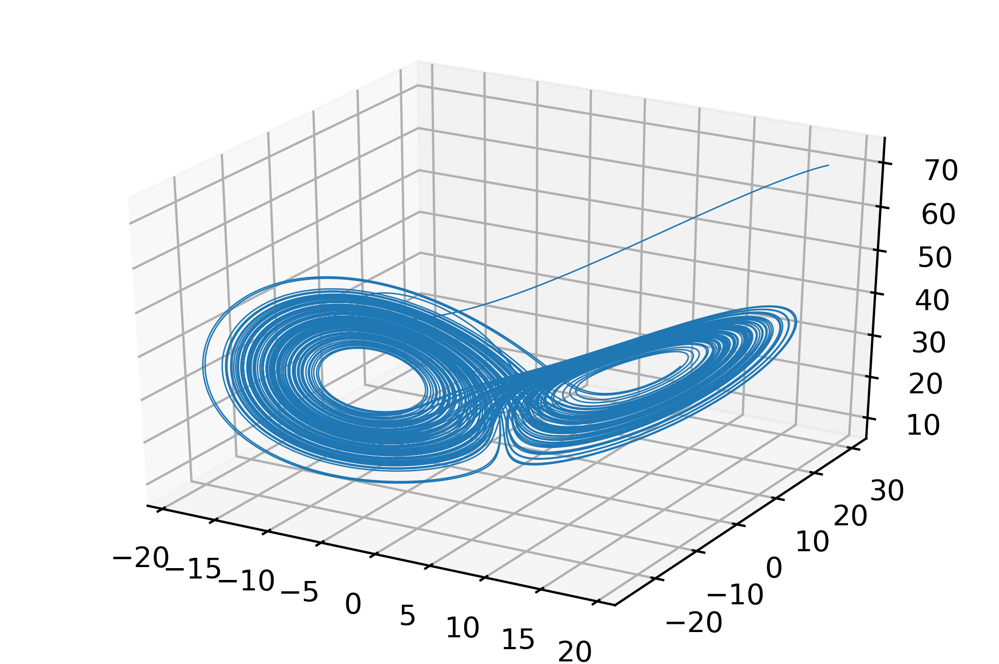

In [26]:
_, axes = plt.subplots(nrows=1, ncols=1, figsize=(6, 4), dpi=400, subplot_kw={'projection': '3d'})
f = get_f(10.0, 8 / 3, 30)
rez = implicit_euler(init[0], 100, f, 0.001).T
axes.plot(rez[0], rez[1], rez[2], linewidth=0.5)
plt.show()

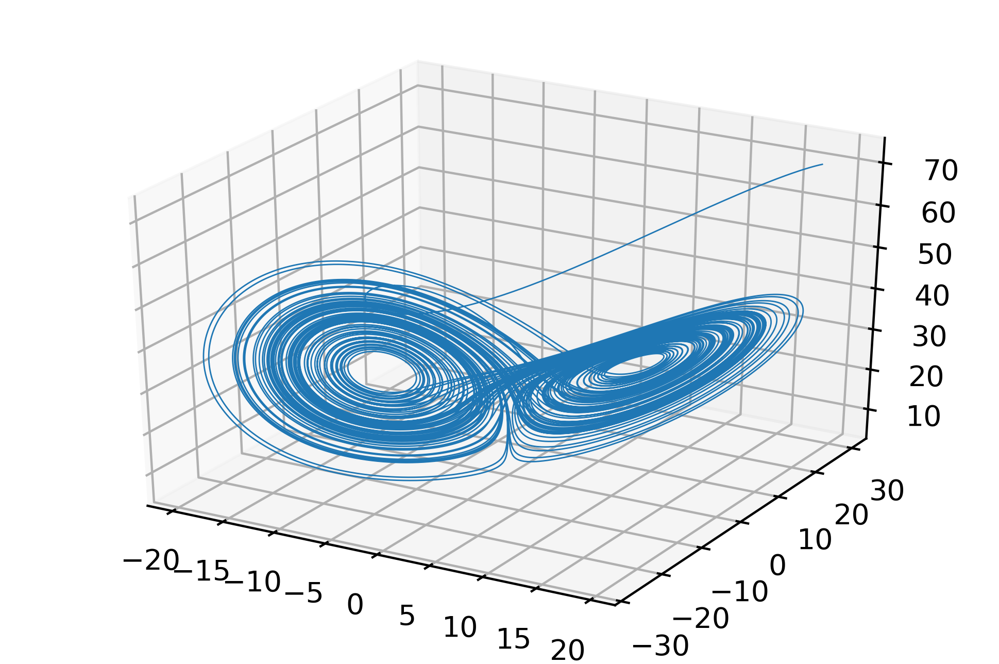

In [27]:
_, axes = plt.subplots(nrows=1, ncols=1, figsize=(6, 4), dpi=400, subplot_kw={'projection': '3d'})
f = get_f(10.0, 8 / 3, 30)
rez = implicit_euler(init[0], 100, f, 0.0001).T
axes.plot(rez[0], rez[1], rez[2], linewidth=0.5)
plt.show()

Для метода Адамса-Башфорта-Моултона 4 порядка

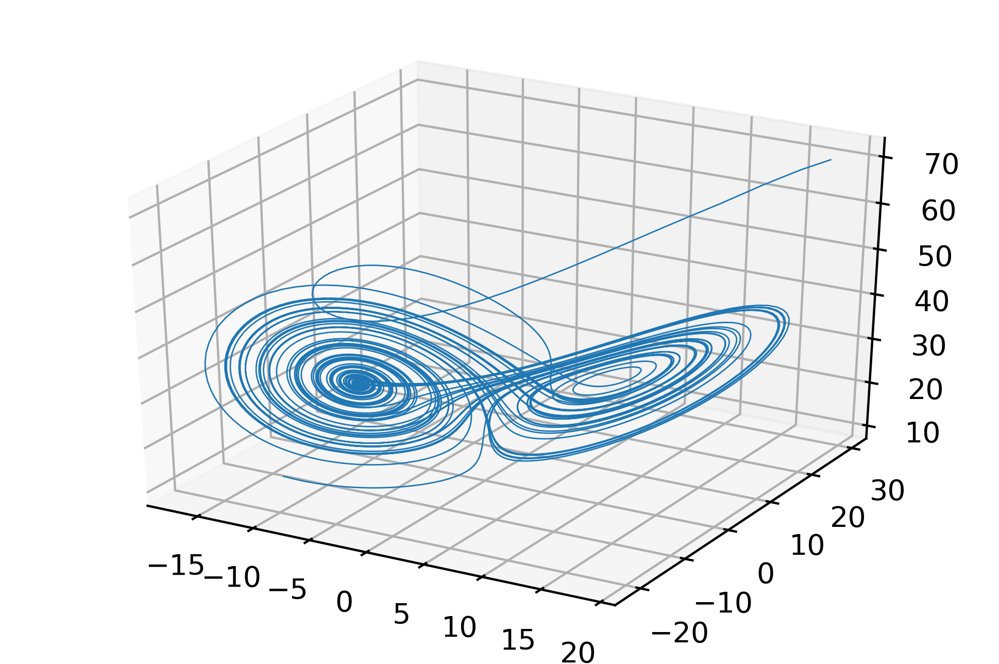

In [28]:
_, axes = plt.subplots(nrows=1, ncols=1, figsize=(6, 4), dpi=400, subplot_kw={'projection': '3d'})
f = get_f(10.0, 8 / 3, 30)
rez = adams_bashforth_moulton(init[0], 100, f, 0.01).T
axes.plot(rez[0], rez[1], rez[2], linewidth=0.5)
plt.show()

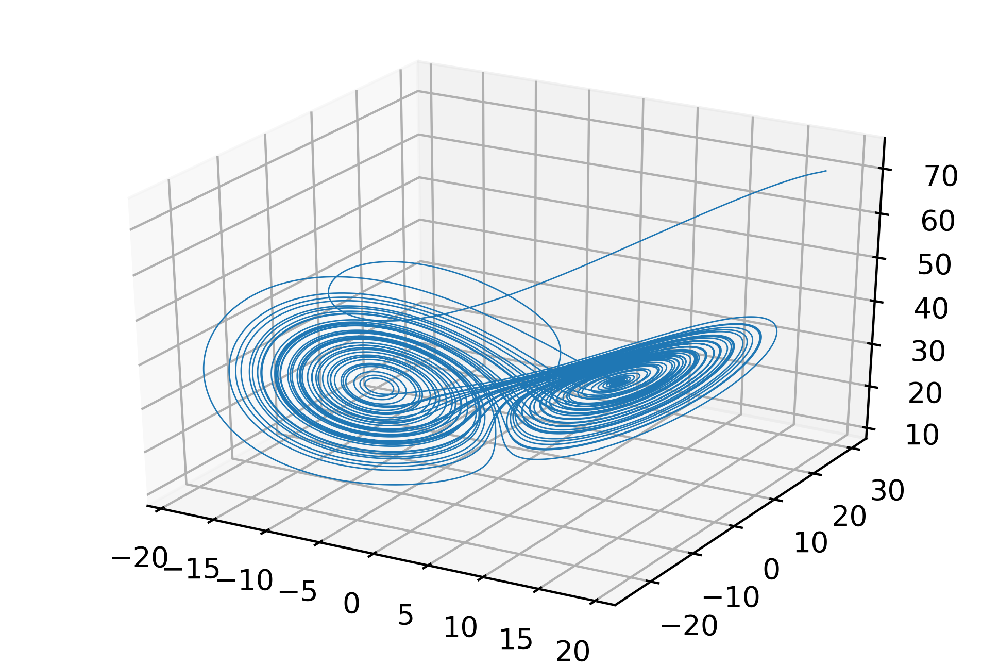

In [29]:
_, axes = plt.subplots(nrows=1, ncols=1, figsize=(6, 4), dpi=400, subplot_kw={'projection': '3d'})
f = get_f(10.0, 8 / 3, 30)
rez = adams_bashforth_moulton(init[0], 100, f, 0.001).T
axes.plot(rez[0], rez[1], rez[2], linewidth=0.5)
plt.show()

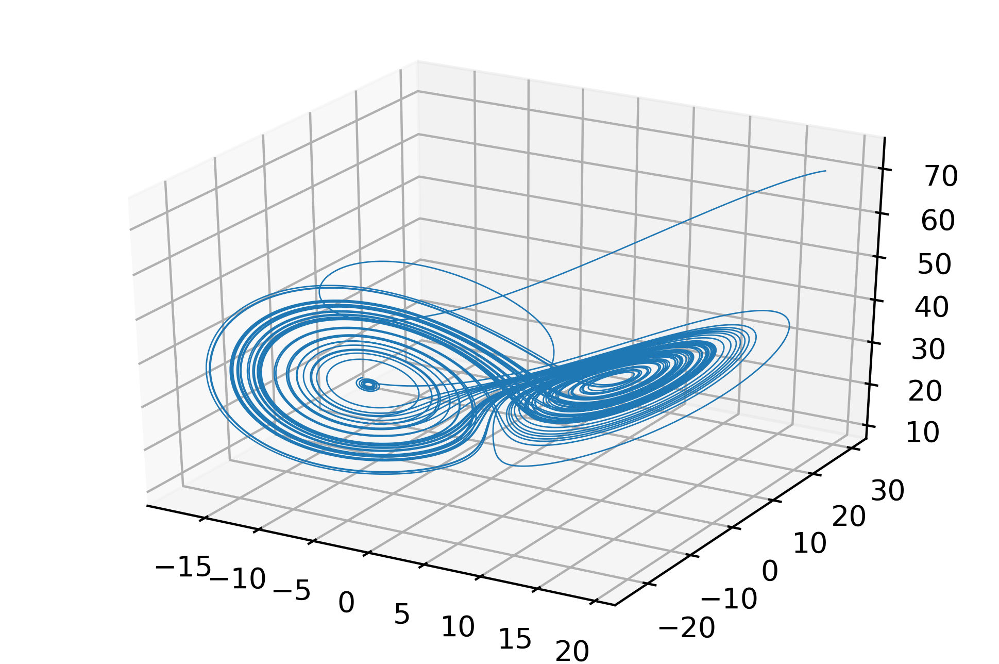

In [30]:
_, axes = plt.subplots(nrows=1, ncols=1, figsize=(6, 4), dpi=400, subplot_kw={'projection': '3d'})
f = get_f(10.0, 8 / 3, 30)
rez = adams_bashforth_moulton(init[0], 100, f, 0.0001).T
axes.plot(rez[0], rez[1], rez[2], linewidth=0.5)
plt.show()